In [371]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, LabelEncoder 


Create fake dataframe

In [372]:
# Parameters
stores = ['1', '2', '3', '4', '5']
items = [f'{i}' for i in range(1, 21)]
date_range = pd.date_range(start='2020-01-01', end='2021-12-31')

# Create a multi-index with all combinations of stores, dates, and items
index = pd.MultiIndex.from_product([stores, date_range, items], names=['Store', 'Date', 'Item'])

# Create DataFrame with this multi-index
df = pd.DataFrame(index=index).reset_index()

# Generate random unit sales
np.random.seed(42)
units_sold = np.random.randint(1, 100, size=len(index))

# Create DataFrame
sales_df = pd.DataFrame({'Units_Sold': units_sold}, index=index).reset_index()

# Assign perishability (randomly assign 50% of items as perishable)
perishable_items = np.random.choice(['Yes', 'No'], size=len(items), p=[0.5, 0.5])
item_perishability_map = dict(zip(items, perishable_items))
sales_df['Perishable'] = sales_df['Item'].map(item_perishability_map)

# Assign promotions (randomly assign 10% of the days to have promotions)
sales_df['Promotion'] = np.random.choice(['Yes', 'No'], size=len(sales_df), p=[0.10, 0.90])

# Assign holidays (randomly assign 5% of the days as holidays)
sales_df['Holiday'] = np.random.choice(['Yes', 'No'], size=len(sales_df), p=[0.05, 0.95])


df=sales_df

df.head()

,Store,Date,Item,Units_Sold,Perishable,Promotion,Holiday
0,1,2020-01-01,1,52,No,Yes,No
1,1,2020-01-01,2,93,No,No,No
2,1,2020-01-01,3,15,Yes,No,No
3,1,2020-01-01,4,72,No,No,No
4,1,2020-01-01,5,61,No,No,No


Add week numbers

In [373]:
def weekday_weeknumber(df): 
    df = df.copy()
    # Add column with name weekday, weeknumbers
    df['weekday'] = df['Date'].dt.dayofweek + 1
    df['week_nbr'] = df['Date'].dt.isocalendar().week
    # Add cumulative week numbers, first define first date and first monday
    first_date = df['Date'].min()
    day_of_week = first_date.weekday()
    days_to_last_monday = (day_of_week - 0 + 7) % 7
    monday_first_week = first_date - pd.Timedelta(days=days_to_last_monday)
    # Calculate cumulative week numbers and add column
    df['week_number_cum'] = (df['Date'] - monday_first_week).dt.days // 7 + 1
    # Optimize memory
    df['weekday'] = df['weekday'].astype('int8')
    df['week_nbr'] = df['week_nbr'].astype('int8')
    df['week_number_cum'] = df['week_number_cum'].astype('int16')
    return df

In [374]:
df = weekday_weeknumber(df)
df.head()

,Store,Date,Item,Units_Sold,Perishable,Promotion,Holiday,weekday,week_nbr,week_number_cum
0,1,2020-01-01,1,52,No,Yes,No,3,1,1
1,1,2020-01-01,2,93,No,No,No,3,1,1
2,1,2020-01-01,3,15,Yes,No,No,3,1,1
3,1,2020-01-01,4,72,No,No,No,3,1,1
4,1,2020-01-01,5,61,No,No,No,3,1,1


Aggregate dataframe

In [375]:
def calculate_yes_percentage(series):
    return (series == 'Yes').mean() * 100

aggregated_df = df.groupby(['Store', 'Item', 'week_number_cum']).agg(
    Units_Sold=('Units_Sold', 'sum'),
    Perishable=('Perishable', lambda x: 'Yes' if (x == 'Yes').any() else 'No'),
    Promotion_pct=('Promotion', calculate_yes_percentage),
    Holiday_pct=('Holiday', calculate_yes_percentage)
).reset_index()

# Display the aggregated data
aggregated_df.head()


,Store,Item,week_number_cum,Units_Sold,Perishable,Promotion_pct,Holiday_pct
0,1,1,1,271,No,20.000000,0.0
1,1,1,2,292,No,14.285714,0.0
2,1,1,3,363,No,0.000000,0.0
3,1,1,4,327,No,0.000000,0.0
4,1,1,5,288,No,14.285714,0.0


In [376]:
df = aggregated_df

In [377]:
label_encoder = LabelEncoder()
df['Perishable'] = label_encoder.fit_transform(df['Perishable'])
df['Item'] = df['Item'].astype('category')
df['Store'] = df['Store'].astype('category')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10500 entries, 0 to 10499
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   Store            10500 non-null  category
 1   Item             10500 non-null  category
 2   week_number_cum  10500 non-null  int16   
 3   Units_Sold       10500 non-null  int32   
 4   Perishable       10500 non-null  int32   
 5   Promotion_pct    10500 non-null  float64 
 6   Holiday_pct      10500 non-null  float64 
dtypes: category(2), float64(2), int16(1), int32(2)
memory usage: 288.1 KB


Train-test-split

In [378]:
df_test = df[df['week_number_cum'] > 79]
df_train = df[df['week_number_cum'] <= 79] 

In [379]:
X_train = df_train[['Store', 'Item', 'week_number_cum', 'Perishable', 'Promotion_pct', 'Holiday_pct']]
y_train = df_train['Units_Sold']

X_test = df_test[['Store', 'Item', 'week_number_cum', 'Perishable', 'Promotion_pct', 'Holiday_pct']]
y_test = df_test['Units_Sold']


Scaling

In [380]:
scaler = StandardScaler()  # Initialize the scale
X_train_scaled = scaler.fit_transform(X_train)  # Fit and transform the training data
X_test_scaled = scaler.transform(X_test)  # Transform the test data

Fit model

In [381]:
model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1)

model.fit(X_train_scaled, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

Predict

In [382]:
y_pred = model.predict(X_test_scaled)

Evaluation

In [383]:
# Calculate MAPE (Mean Absolute Percentage Error)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
print(f'MAPE: {mape:.2f}%')

# Calculate Accuracy (percentage of predictions within 10% of actuals)
accuracy = np.mean(np.abs((y_test - y_pred) / y_test) < 0.1) * 100
print(f'Accuracy: {accuracy:.2f}%')

MAPE: 21.69%
Accuracy: 33.04%


In [369]:
len(y_test)

2600

In [370]:
len(y_pred)

2600

Modelling

In [241]:


# Step 3: Encode categorical variables
label_encoder = LabelEncoder()
lagged_df['Perishable'] = label_encoder.fit_transform(lagged_df['Perishable'])

# Step 4: Train-Test Split and Model Training
results = []

for (store, item), group in lagged_df.groupby(['Store', 'Item']):
    # Split data into train and test sets
    train_size = len(group) - 26  # Use the last 26 time points for testing
    
    # Prepare features and target
    X_train = group.iloc[:train_size].drop(columns=['Units_Sold', 'Store', 'Item', 'week_number_cum']).values
    y_train = group.iloc[:train_size]['Units_Sold'].values

    X_test = group.iloc[train_size:].drop(columns=['Units_Sold', 'Store', 'Item', 'week_number_cum']).values
    y_test = group.iloc[train_size:]['Units_Sold'].values

    # Step 5: Scale the Features
    scaler = StandardScaler()  # Initialize the scaler
    X_train_scaled = scaler.fit_transform(X_train)  # Fit and transform the training data
    X_test_scaled = scaler.transform(X_test)  # Transform the test data

    # Step 6: Train the XGBoost Model
    model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100)
    model.fit(X_train_scaled, y_train)

    # Step 7: Make Rolling Predictions
    def rolling_forecast(model, X, n_rolls):
        preds = []
        for i in range(n_rolls):
            pred = model.predict(X[i].reshape(1, -1))
            preds.append(pred[0])
            # Update the lag features with the new prediction
            if i + 1 < n_rolls:  # Check to avoid index out of range
                X[i + 1, -1] = pred  # The last lag becomes the new prediction
        return preds

    # Prepare for rolling prediction
    n_rolls = len(X_test_scaled)
    X_roll = np.array([list(X_test_scaled[i]) for i in range(n_rolls)])
    predictions = rolling_forecast(model, X_roll, n_rolls)

    # Calculate evaluation metrics
    bias = np.mean(predictions) - np.mean(y_test)
    mape = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    accuracy = np.mean(np.abs((y_test - predictions) / y_test) < 0.1) * 100  # 10% accuracy

    # Store results for evaluation
    results.append({
        'Store': store,
        'Item': item,
        'Actual': y_test,
        'Predicted': predictions,
        'Bias': bias,
        'MAPE': mape,
        'Accuracy': accuracy
    })

# Convert results to DataFrame for easier analysis
results_df = pd.DataFrame(results)

# Print the evaluation metrics for each store-item combination
results_df[['Store', 'Item', 'Bias', 'MAPE', 'Accuracy']]


C:\Users\J.Heuvelmans\AppData\Local\Temp\ipykernel_12924\3026344246.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lagged_df['Perishable'] = label_encoder.fit_transform(lagged_df['Perishable'])
C:\Users\J.Heuvelmans\AppData\Local\Temp\ipykernel_12924\3026344246.py:45: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  X[i + 1, -1] = pred  # The last lag becomes the new prediction
C:\Users\J.Heuvelmans\AppData\Local\Temp\ipykernel_12924\3026344246.py:45: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you

,Store,Item,Bias,MAPE,Accuracy
0,1,1,31.965623,30.444018,23.076923
1,1,10,38.956207,27.127084,30.769231
2,1,11,14.663001,20.972814,26.923077
3,1,12,14.897926,15.480962,34.615385
4,1,13,-24.943693,23.078024,34.615385
...,...,...,...,...,...
95,5,5,8.555218,21.850890,38.461538
96,5,6,-1.952158,18.487410,46.153846
97,5,7,36.842581,26.442362,30.769231
98,5,8,-25.198010,16.032134,38.461538


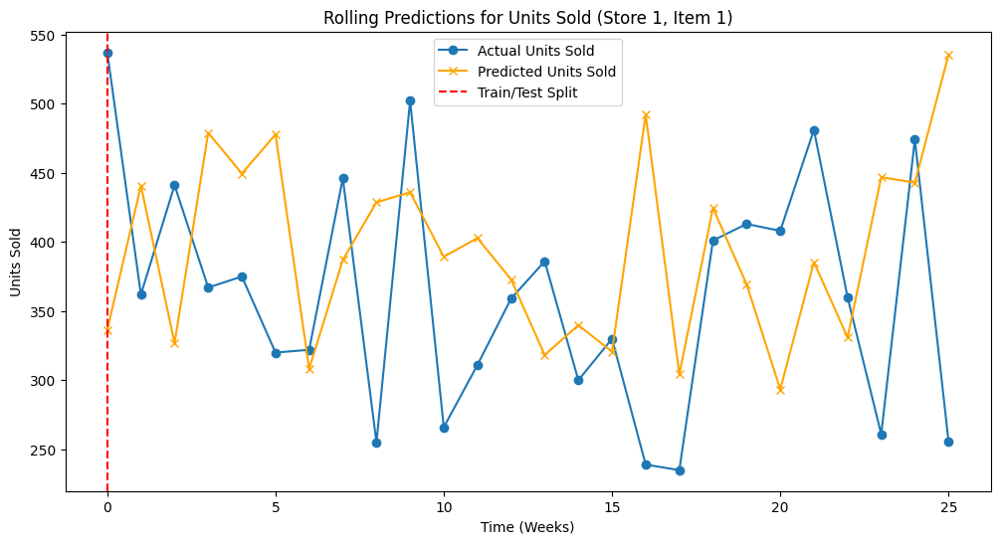

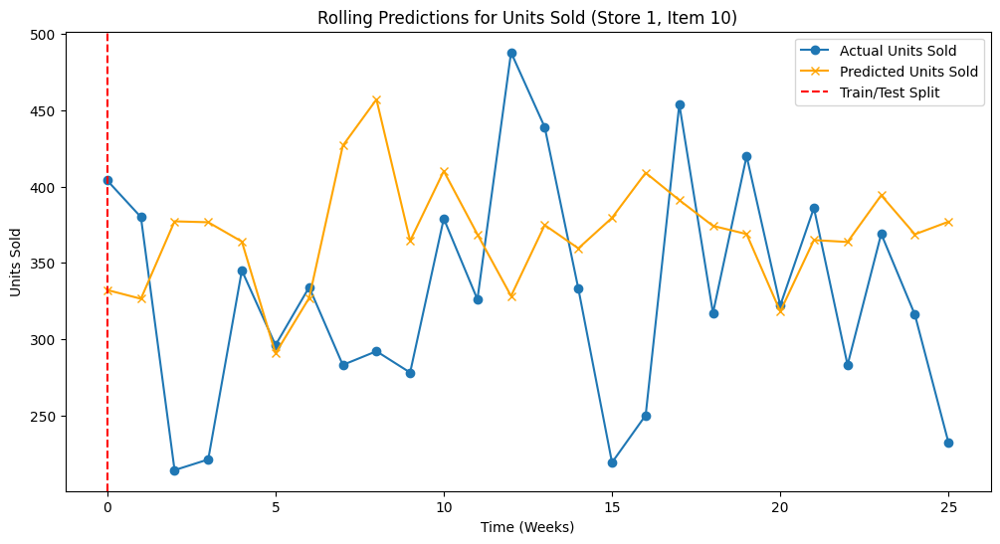

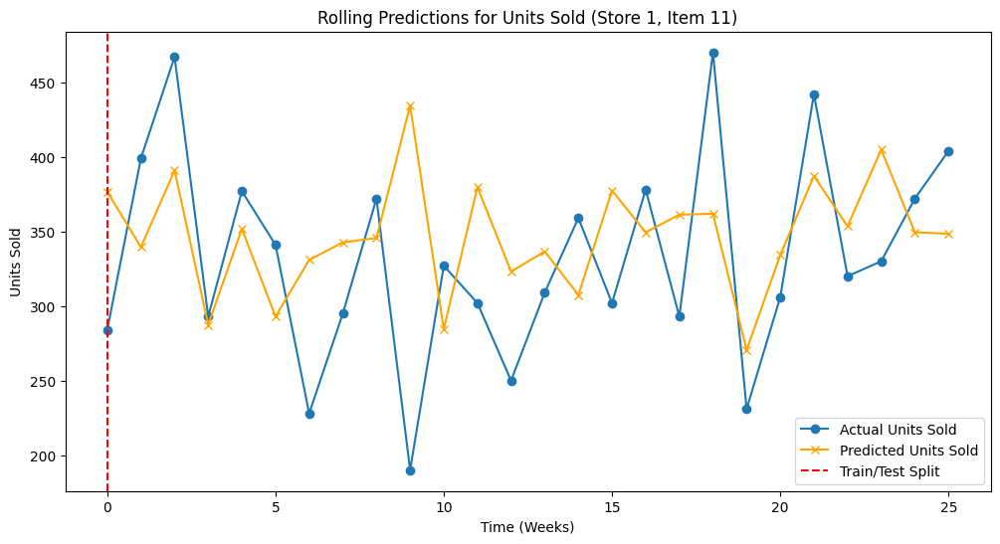

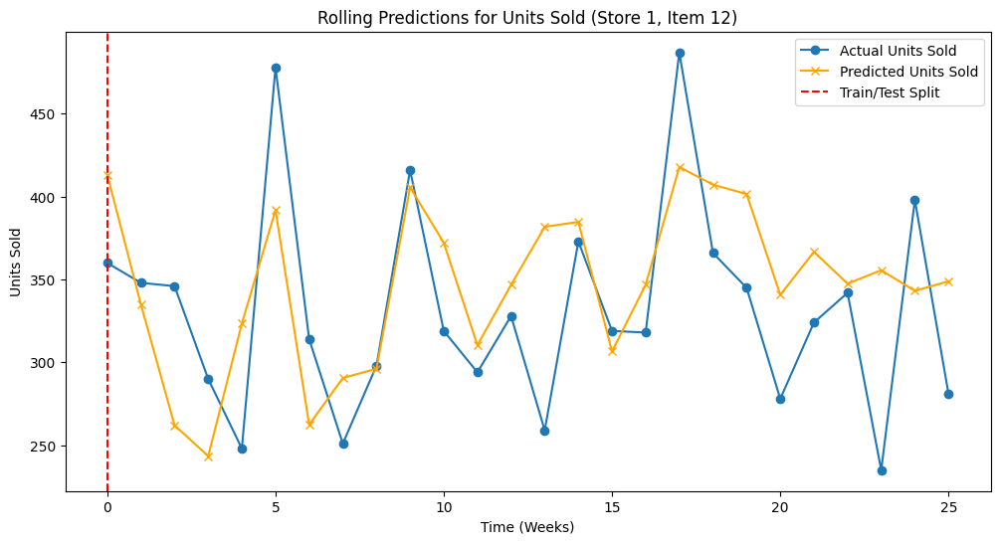

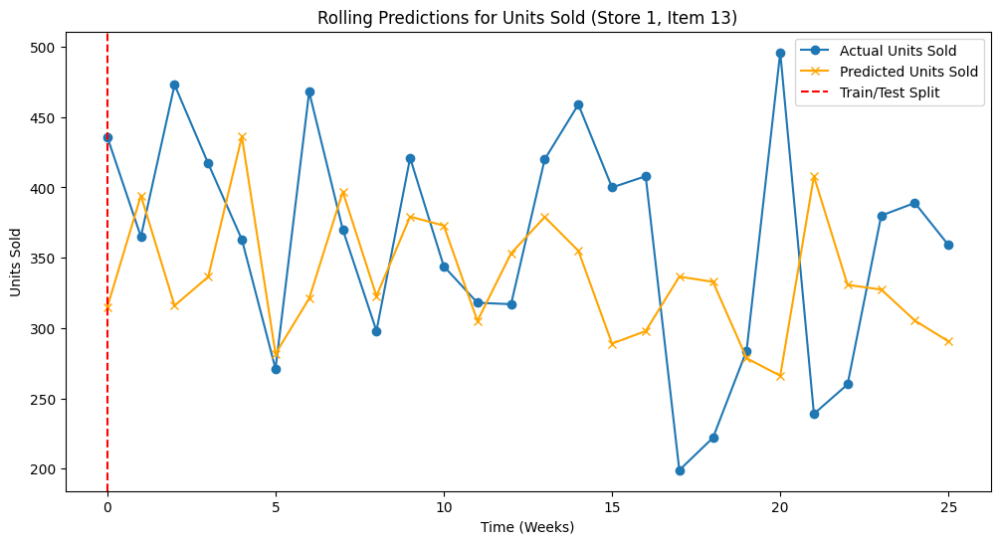

...

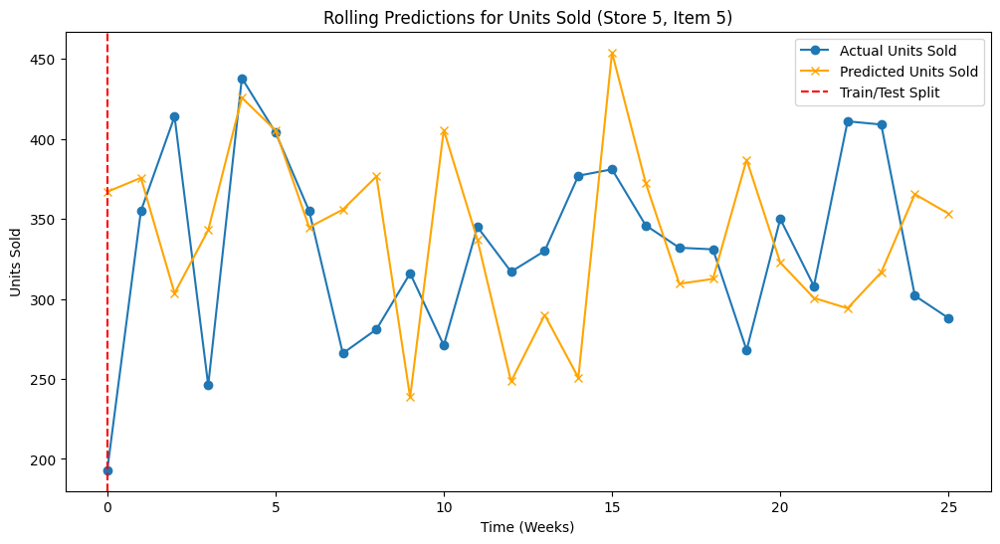

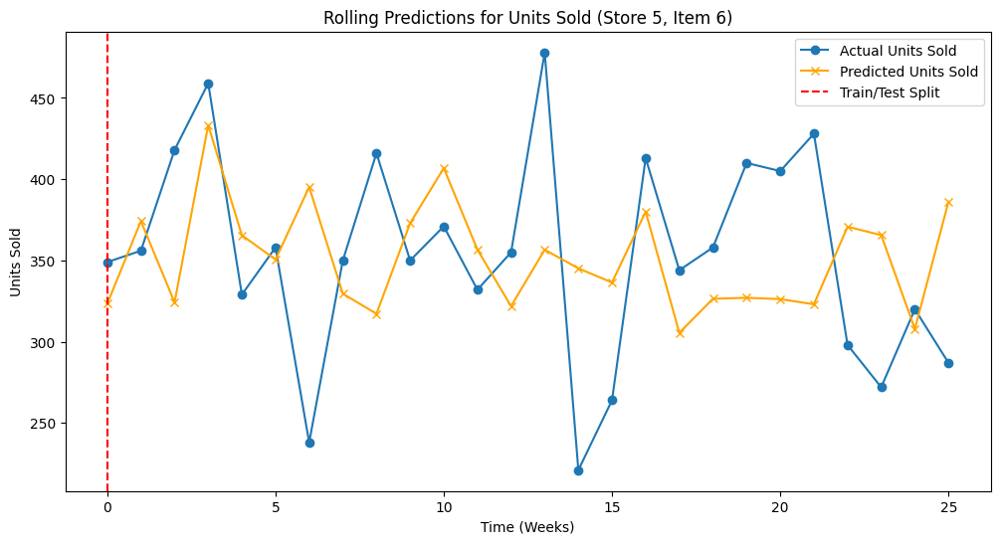

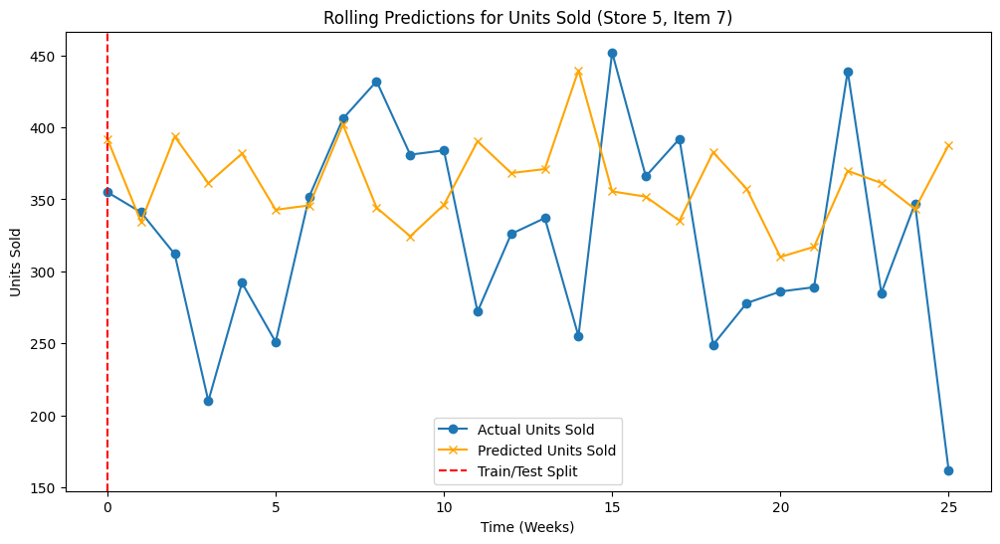

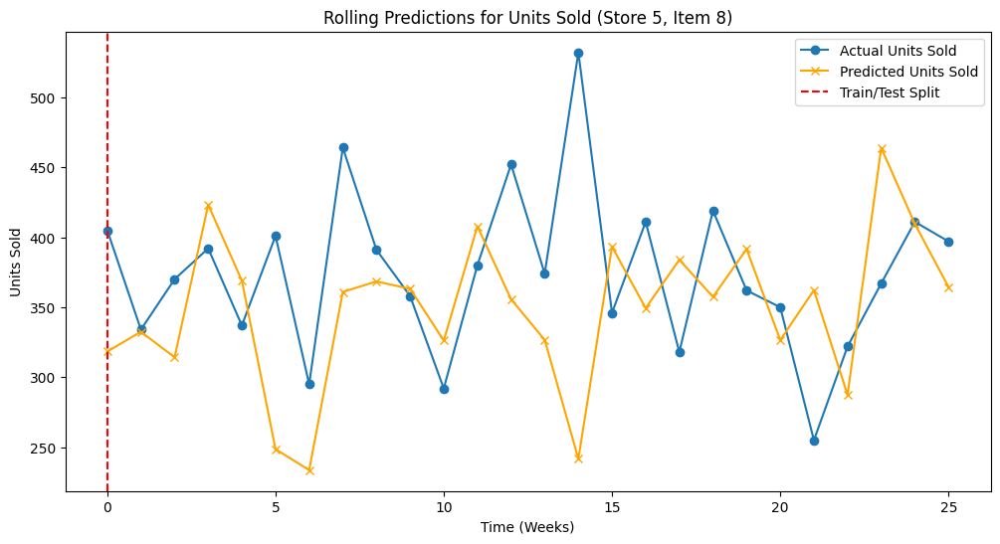

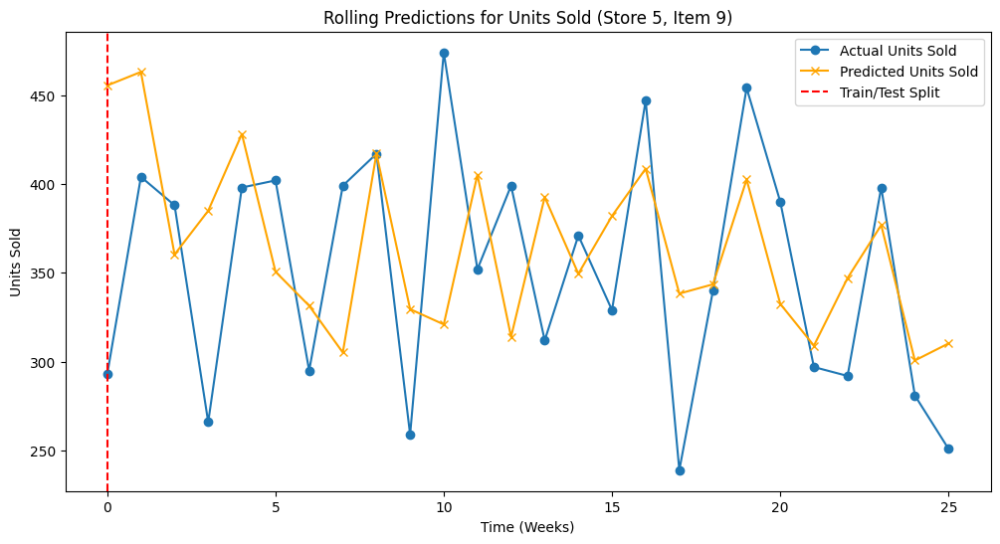

In [242]:
# Step 8: Visualize the Results for each combination (optional)
for store, item in results_df[['Store', 'Item']].drop_duplicates().values:
    group = results_df[(results_df['Store'] == store) & (results_df['Item'] == item)]
    actuals = group['Actual'].values[0]
    preds = group['Predicted'].values[0]
    
    plt.figure(figsize=(12, 6))
    plt.plot(range(len(actuals)), actuals, label='Actual Units Sold', marker='o')
    plt.plot(range(len(preds)), preds, label='Predicted Units Sold', color='orange', marker='x')
    plt.axvline(x=len(actuals) - len(preds), color='red', linestyle='--', label='Train/Test Split')
    plt.title(f'Rolling Predictions for Units Sold (Store {store}, Item {item})')
    plt.xlabel('Time (Weeks)')
    plt.ylabel('Units Sold')
    plt.legend()
    plt.show()

In [243]:
predictions

[455.42395,
 463.02643,
 360.30695,
 384.93484,
 428.12427,
 350.6242,
 331.48502,
 305.16595,
 417.11346,
 329.56903,
 320.9835,
 405.1874,
 313.9882,
 392.63818,
 349.47852,
 382.0152,
 408.63712,
 338.31683,
 343.53912,
 402.52322,
 332.54318,
 309.04346,
 347.065,
 376.86984,
 300.69485,
 310.2578]

In [244]:
y_test

array([293, 404, 388, 266, 398, 402, 295, 399, 417, 259, 474, 352, 399,
       312, 371, 329, 447, 239, 340, 454, 390, 297, 292, 398, 281, 251])